In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv  # For an initial graph convolution layer.
import numpy as np                   
import matplotlib.pyplot as plt
from torch_geometric.data import Data  # Data structure for graph data.
from torch_geometric.loader import DataLoader
import umap.umap_ as umap
#from torch_scatter import scatter_mean
from torch_geometric.nn import global_mean_pool
from torch_geometric.nn import GATConv
from torch_geometric.utils import k_hop_subgraph, subgraph
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn.cluster import KMeans
#import math
from torchinfo import summary
from torchviz import make_dot
import torch.fx as fx
import os
import optuna

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Setting device to:", device)
#elif torch.backends.mps.is_available:
 #   device = torch.device("mps")  # Instead of "cuda" or "cpu"
  #  print("Setting device to:", device)
else:
    device = torch.device("cpu")
    print("Setting device to:", device)

#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Setting device to: cpu


**Chromosome Tested**: Chromosome 3

In [2]:
"""
TODO: Change the path to the Chromosome 3.
"""
path_chr3 = './imr90/hic_matrix/chr3.npz'  # Load the Hi-C matrix.

# Creating the Hi-C Matrix

## Hi-C Matrix Normalization

Given a raw matrix $M$, I am going to normalize it according to the equation (1) in the [paper I am following](https://pubmed.ncbi.nlm.nih.gov/37287135/). First we log scale the data, and then we min-max normalize it as follows:

1. **Log-transforming the raw matrix**: $M_{\log_{10}} = \log_{10}(1 + M)$

2. **Min-max normalization of the log-transformed matrix**: $M_{\text{log}_{10}\_\text{normalized}} = \frac{M_{\log_{10}} - \min_{i,j}(M_{\log_{10}})}{\max_{i,j}(M_{\log_{10}}) - \min_{i,j}(M_{\log_{10}})}$


In [3]:
def normalize_matrix(matrix):
    # Step 1: Log transform
    matrix_log10 = np.log10(1 + matrix)
    
    # Step 2: Min-max normalization
    min_val = np.min(matrix_log10)
    max_val = np.max(matrix_log10)
    matrix_log10_normalized = (matrix_log10 - min_val) / (max_val - min_val)
    
    return matrix_log10_normalized

In [4]:
def load_hic_data(path):
    data = np.load(path)  # Load the Hi-C matrix from the NPZ file.
    matrix_size = len(data["0"])  # Assuming all diagonal keys have the same length
    hic_matrix = np.zeros((matrix_size, matrix_size))  # Initialize an empty matrix

    # Fill the matrix using diagonal keys
    for key in data.files:
        diag_values = data[key]
        diag_index = int(key)  # Convert key to integer

        # Upper diagonals
        if diag_index >= 0:
            np.fill_diagonal(hic_matrix[:, diag_index:], diag_values)
        # Lower diagonals (symmetric)
        if diag_index < 0:
            np.fill_diagonal(hic_matrix[-diag_index:, :], diag_values)

    # Ensure symmetry
    hic_matrix = hic_matrix + hic_matrix.T - np.diag(np.diag(hic_matrix))

    hic_matrix_normalized = normalize_matrix(hic_matrix)

    return hic_matrix_normalized

In [5]:
chr3_hic_matrix = load_hic_data(path_chr3)  # Load and normalize the Hi-C matrix.

## Creating the Training Mask

Here, I am zeroing out a specific window in the Hi-C matrix. This window will not become a part of the graph data because the graph selects for only the positions that have a normalized interaction frequency of $> 0.3$.

The training mask itself becomes the test set that can be used to measure the performance of the model at the end.

In [9]:
def mask_defined_window(hic_matrix, start_position, mask_size):
    
    # Mask the window
    hic_matrix[start_position:start_position+mask_size, start_position:start_position+mask_size] = 0

    print(f"Masked matrix \n"
          f"Masked Rows: {start_position}-{start_position + mask_size}"
          f"\nMasked Columns: {start_position}-{start_position + mask_size}")
    
    return hic_matrix
#----------------------------------------------------------------------------------------
start_position = 250  # Starting position of the mask
mask_size = 150  # Size of the mask

chr3_matrix_masked = mask_defined_window(chr3_hic_matrix.copy(), 
                                         start_position=start_position, 
                                         mask_size=mask_size)

Masked matrix 
Masked Rows: 250-400
Masked Columns: 250-400


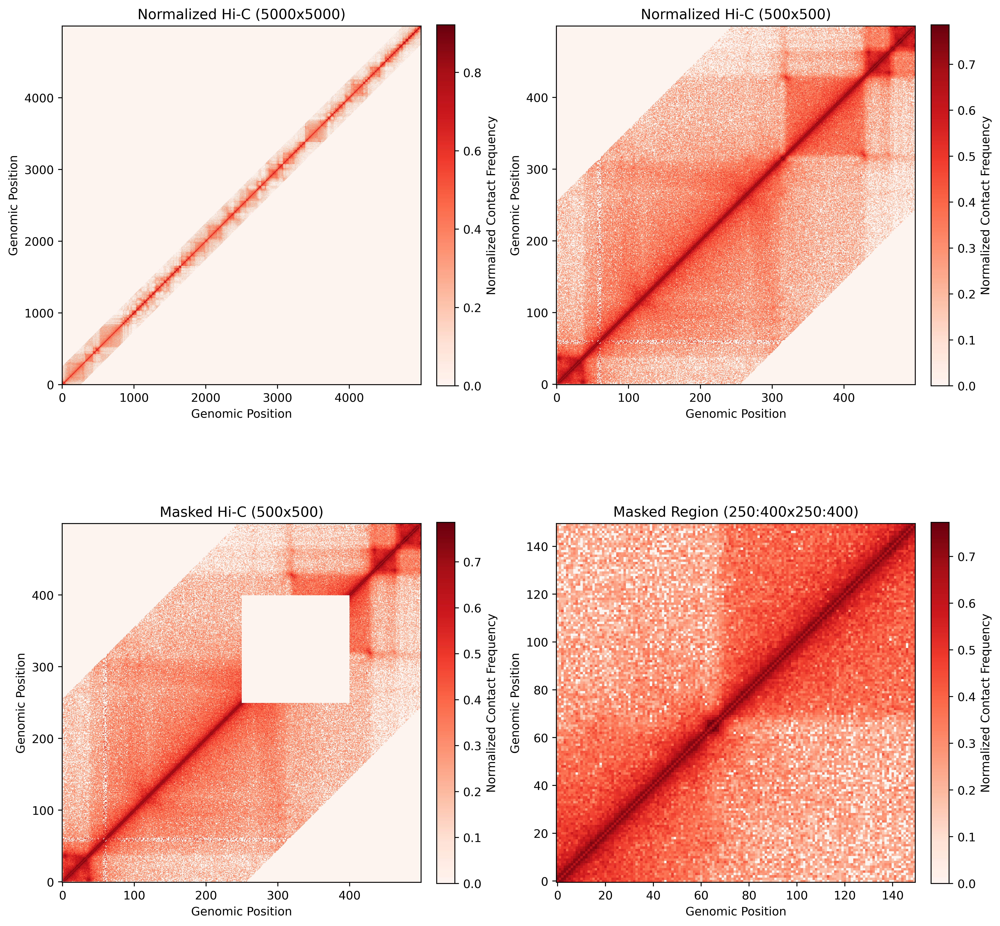

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12), dpi=500)

# Top-left: Full 5000x5000 normalized matrix
im1 = axes[0, 0].imshow(chr3_hic_matrix[:5000, :5000], cmap='Reds', interpolation='nearest', origin='lower')
axes[0, 0].set_title("Normalized Hi-C (5000x5000)")
axes[0, 0].set_xlabel("Genomic Position")
axes[0, 0].set_ylabel("Genomic Position")
fig.colorbar(im1, ax=axes[0, 0], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# Top-right: Zoom-in on 500x500 region
im2 = axes[0, 1].imshow(chr3_hic_matrix[:500, :500], cmap='Reds', interpolation='nearest', origin='lower')
axes[0, 1].set_title("Normalized Hi-C (500x500)")
axes[0, 1].set_xlabel("Genomic Position")
axes[0, 1].set_ylabel("Genomic Position")
fig.colorbar(im2, ax=axes[0, 1], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# Bottom-left: Masked version of same 500x500 region
im3 = axes[1, 0].imshow(chr3_matrix_masked[:500, :500], cmap='Reds', interpolation='nearest', origin='lower')
axes[1, 0].set_title("Masked Hi-C (500x500)")
axes[1, 0].set_xlabel("Genomic Position")
axes[1, 0].set_ylabel("Genomic Position")
fig.colorbar(im3, ax=axes[1, 0], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# Bottom-right: Just the masked region
im4 = axes[1, 1].imshow(chr3_hic_matrix[start_position:start_position+mask_size, start_position:start_position+mask_size], 
                        cmap='Reds', interpolation='nearest', origin='lower')
axes[1, 1].set_title(f"Masked Region ({start_position}:{start_position+mask_size}x{start_position}:{start_position+mask_size})")
axes[1, 1].set_xlabel("Genomic Position")
axes[1, 1].set_ylabel("Genomic Position")
fig.colorbar(im4, ax=axes[1, 1], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

plt.tight_layout()
plt.show()

# Generating the Graph Data

## Creating the Graph Dataset 

I am doing the following to conver the Hi-C matrix into a graph:

1. **Normalizing genomic locations**: I am normalizing genmoic locations and converting them to a value between 0-1, which is directly proportional to the genomic distance. This helps in efficient processing by using a smaller number, and it also helps avoid the model placing a higher weight on larger values (more distant loci), just because they are bigger numbers. 

2. **Getting the upper triange**: I am using `triu_indices` to get the upper triangle of the matrix and then removing any cells that are zeroes - this also helps in improving efficiency because the Hi-C matrix is symmetrical so it's the same thing either way. 

3. **Stacking is necessary for PyTorch Geometric**: PyTorch Geometric expects the edge index to be of the shape `[2, num_edges]`.

4. **Calculating the distance between genomic loci**: Again, I am calculating a normalized distance between the nodes (i, j) and I am adding them to the `edge_features` variable. Since it's a bidirectional graph, I am doing $\times 2$ so that I get the same thing for nodes (j, i) too because they are both equivalent. 

In [11]:
def hic_matrix_to_graph(hic_matrix):
    matrix_size = hic_matrix.shape[0]

    # 1. Node features (normalized position)
    node_positions = np.array([i / matrix_size for i in range(matrix_size)]).reshape(-1, 1)

    # 2. Edge indices and features (undirected by design)
    rows, cols = np.triu_indices(matrix_size, k=0)
    non_zero_cells = hic_matrix[rows, cols] > 0.3  # Threshold for non-zero contact frequency
    rows, cols = rows[non_zero_cells], cols[non_zero_cells]

    # Create bidirectional edges
    edge_sources = np.concatenate([rows, cols])
    edge_targets = np.concatenate([cols, rows])

    edge_index = torch.tensor(np.stack([edge_sources, edge_targets]), dtype=torch.long).to(device)

    # Edge features: [distance, interaction_frequency]
    edge_features = []
    node_edge_distance_sum = np.zeros(matrix_size)
    node_edge_count = np.zeros(matrix_size)

    for i, j in zip(rows, cols):
        distance = abs(i - j) / matrix_size
        interaction = hic_matrix[i, j]
        edge_features.extend([interaction] * 2)

        # Sum distances for node i and node j
        node_edge_distance_sum[i] += distance
        node_edge_distance_sum[j] += distance
        node_edge_count[i] += 1
        node_edge_count[j] += 1

    # Avoid divide by zero
    avg_node_distances = node_edge_distance_sum / np.maximum(node_edge_count, 1)
    avg_node_distances = avg_node_distances.reshape(-1, 1)

    #chromosome_number = np.full((matrix_size, 1), chromosome)

    # Combine normalized position and average edge distance as node features
    node_features = np.concatenate([node_positions, avg_node_distances], axis=1)
    node_features = torch.tensor(node_features, dtype=torch.float32).to(device)

    # Final edge attributes
    edge_attr = torch.tensor(edge_features, dtype=torch.float32).unsqueeze(1).to(device)

    # 3. Create PyG Data object
    data = Data(x=node_features,
                edge_index=edge_index,
                edge_attr=edge_attr)

    return data.to(device)

Graph summary:
 - Nodes: 500
 - Edges: 78722
 - Node features: torch.Size([500, 2])
 - Edge features: torch.Size([78722, 1])

Graph summary:
 - Nodes: 90
 - Edges: 5822
 - Node features: torch.Size([90, 2])
 - Edge features: torch.Size([5822, 1])
 - Number of Masked Edges: 72900

Graph summary:
 - Nodes: 150
 - Edges: 13320
 - Node features: torch.Size([150, 2])
 - Edge features: torch.Size([13320, 1])


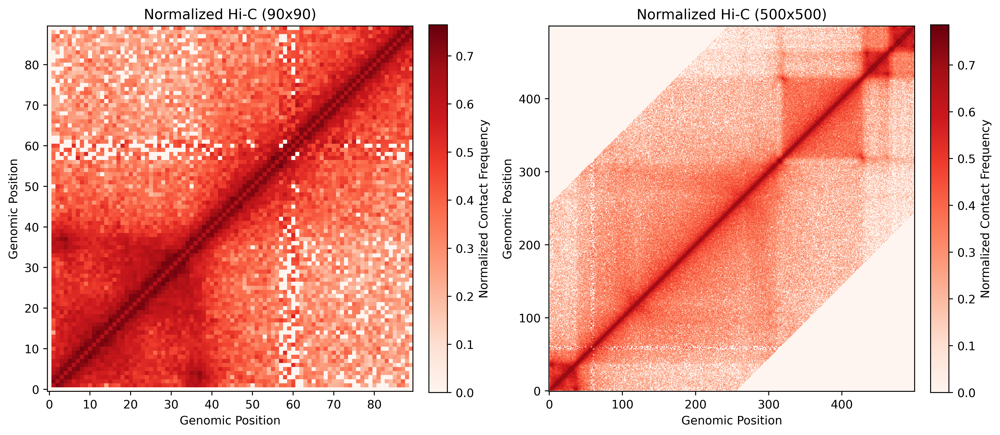

In [12]:
#graph_data = hic_matrix_to_graph(chr3_hic_matrix[:500, :500], chromosome=3)
graph_data = hic_matrix_to_graph(chr3_hic_matrix[:500, :500])

print("Graph summary:\n",
      f"- Nodes: {graph_data.num_nodes}\n",
      f"- Edges: {graph_data.num_edges}\n",
      f"- Node features: {graph_data.x.shape}\n",
      f"- Edge features: {graph_data.edge_attr.shape}\n")

"""
TODO: Change the input size of the training graph data.
"""

#train_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:50, :50], chromosome=3)
train_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:90, :90])

print("Graph summary:\n",
      f"- Nodes: {train_graph_data.num_nodes}\n",
      f"- Edges: {train_graph_data.num_edges}\n",
      f"- Node features: {train_graph_data.x.shape}\n",
      f"- Edge features: {train_graph_data.edge_attr.shape}\n",
      f"- Number of Masked Edges: {graph_data.num_edges - train_graph_data.num_edges}\n")

test_graph_data = hic_matrix_to_graph(chr3_hic_matrix[start_position:start_position+mask_size, start_position:start_position+mask_size])
#                                      chromosome=3)

print("Graph summary:\n",
      f"- Nodes: {test_graph_data.num_nodes}\n",
      f"- Edges: {test_graph_data.num_edges}\n",
      f"- Node features: {test_graph_data.x.shape}\n",
      f"- Edge features: {test_graph_data.edge_attr.shape}")

fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=500)

# Left: Full 75x75 normalized matrix (adjusted from 5000x5000 for display)
im1 = axes[0].imshow(chr3_hic_matrix[:90, :90], cmap='Reds', interpolation='nearest', origin='lower')
axes[0].set_title("Normalized Hi-C (90x90)")
axes[0].set_xlabel("Genomic Position")
axes[0].set_ylabel("Genomic Position")
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# Right: Zoom-in on 500x500 region
im2 = axes[1].imshow(chr3_hic_matrix[:500, :500], cmap='Reds', interpolation='nearest', origin='lower')
axes[1].set_title("Normalized Hi-C (500x500)")
axes[1].set_xlabel("Genomic Position")
axes[1].set_ylabel("Genomic Position")
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

plt.tight_layout()
plt.show()

## Subgraph Extraction

In this chunk of code, I am doing the following:

1. Extracting two subgraphs centered around two different nodes $(u, v)$

2. Joining the subgraphs by an edge $(e_{u,v})$. To do this, I sample the nodes $u$ & $v$ from the edge index of the graph object to ensure that we only get the nodes that have an edge present between them. This way, we extract the same triplet that the paper did $(u, e_{u,v}, v)$.

3. Finally, I join the two graphs together while keeping only the unique nodes. This essentially replicates the paper's strategy of keeping only unique nodes. 

In [304]:
def subgraph_sampling_for_contrastive_learning(graph_data, u, v, hops=2, verbose=False):
    
    subset, edge_index, mapping, edge_mask = k_hop_subgraph(u, num_hops=hops, edge_index=graph_data.edge_index, relabel_nodes=False)
    subset_2, edge_index_2, mapping_2, edge_mask_2 = k_hop_subgraph(v, num_hops=hops, edge_index=graph_data.edge_index, relabel_nodes=False)

    combined_subset = torch.cat([subset, subset_2]).unique()

    node_mapping = {orig: idx for idx, orig in enumerate(combined_subset.tolist())}
    
    edge_index_combined, edge_attr_combined = subgraph(combined_subset,
                                                       graph_data.edge_index,
                                                       edge_attr=graph_data.edge_attr,
                                                       relabel_nodes=True,
                                                       num_nodes=graph_data.num_nodes)

    final_data = Data(x=graph_data.x[combined_subset],
                      edge_index=edge_index_combined,
                      edge_attr=edge_attr_combined,
                      original_nodes=combined_subset,
                      u_orig=u,  # Track original u
                      v_orig=v)   # Track original v

    if verbose:
        print("Subset:", len(subset), "Subset 2:", len(subset_2))
        print("Combined subset:", len(combined_subset))
        print("Edge index combined:", edge_index_combined)
        print("Edge attr combined:", edge_attr_combined)
        print("\n=== Final Merged Subgraph ===")
        print(f"Original nodes: {len(combined_subset.tolist())}")
        print(f"Total edges: {edge_index_combined.shape[1]}")
        print("Edge list sample:", edge_index_combined.t()[:5].tolist())

    return final_data

## Graph Dataloaders

In [305]:
class SubgraphDataset(torch.utils.data.Dataset):
    def __init__(self, graph_data, num_hops, verbose=False):
        self.data = graph_data
        self.verbose = verbose
        self.num_hops = num_hops
        # list of target edges
        self.pairs = [(u.item(), v.item())
                      for u, v in graph_data.edge_index.t()]
        self.edge_attrs = graph_data.edge_attr  # Store original edge attributes

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        u, v = self.pairs[idx]
        
        #u_tensor = torch.tensor(u, device=self.data.edge_index.device)
        #v_tensor = torch.tensor(v, device=self.data.edge_index.device)
        
        subgraph_data = subgraph_sampling_for_contrastive_learning(self.data, u, v, hops=self.num_hops, verbose=self.verbose).to(device)
        subgraph_data.real_interaction = self.edge_attrs[idx].to(device)
        return subgraph_data

In [306]:
train_data = SubgraphDataset(graph_data=train_graph_data, num_hops=2, verbose=False)
train_loader = DataLoader(train_data, batch_size=8, shuffle=True)  # Use torch_geometric.loader.DataLoader

# 4. Test one batch
for batch in train_loader:
    print("✅ Batch loaded!")
    print("Batch is of type:", type(batch))
    print("Edge index shape:", batch.edge_index.shape)
    print("Node features shape:", batch.x.shape)
    print("Edge attributes shape:", batch.edge_attr.shape)
    print("Original node indices:", batch.original_nodes[:5])
    print("Original u:", batch.real_interaction)
    break

✅ Batch loaded!
Batch is of type: <class 'abc.DataBatch'>
Edge index shape: torch.Size([2, 46576])
Node features shape: torch.Size([712, 2])
Edge attributes shape: torch.Size([46576, 1])
Original node indices: tensor([1, 2, 3, 4, 5])
Original u: tensor([0.4329, 0.5625, 0.6288, 0.3747, 0.6263, 0.5994, 0.3661, 0.3157])


# Setting up the Graph Attention Network

## Node Embeddings Generation using Graph Attention

This is the equation of attention coefficients of a node pair $\alpha_{i,j}$. It tells us how much importance to place on the pair's interaction when updating the embeddings for a node. 

$$
\alpha_{i,j} =
\frac{
\exp\left(\mathrm{LeakyReLU}\left(
\mathbf{a}^{\top}_{s} \mathbf{\Theta}_{s}\mathbf{x}_i
+ \mathbf{a}^{\top}_{t} \mathbf{\Theta}_{t}\mathbf{x}_j
\right)\right)}
{\sum_{k \in \mathcal{N}(i) \cup \{ i \}}
\exp\left(\mathrm{LeakyReLU}\left(
\mathbf{a}^{\top}_{s} \mathbf{\Theta}_{s}\mathbf{x}_i
+ \mathbf{a}^{\top}_{t}\mathbf{\Theta}_{t}\mathbf{x}_k
\right)\right)}
$$

In [307]:
class Nodes_GraphAttentionNetwork(torch.nn.Module):

    #----------------------------------------------------------------------------        
    def __init__(self, in_features, out_features, hidden_dims, num_heads, dropout, self_loops, bias = False):
        
        super(Nodes_GraphAttentionNetwork, self).__init__()

        self.attention_GCV_first = GATConv(in_channels = in_features, 
                                           out_channels = hidden_dims, 
                                           heads=num_heads, 
                                           dropout=dropout,
                                           bias = bias,
                                           add_self_loops = self_loops)
                
        self.attention_GCV_middle = GATConv(in_channels = hidden_dims*num_heads, 
                                          out_channels = hidden_dims, 
                                          heads=num_heads, 
                                          dropout=dropout,
                                          bias = bias,
                                          add_self_loops = self_loops)
        
        self.attention_GCV_last = GATConv(in_channels = hidden_dims*num_heads, 
                                          out_channels = out_features, 
                                          heads=num_heads, 
                                          dropout=dropout,
                                          bias = bias,
                                          add_self_loops = self_loops)
        
        self.activation = nn.LeakyReLU(negative_slope=0.5)

        self.bn1 = nn.BatchNorm1d(hidden_dims * num_heads)
        self.bn2 = nn.BatchNorm1d(hidden_dims * num_heads)
        self.bn3 = nn.BatchNorm1d(out_features * num_heads)


        
        #for conv in [self.attention_GCV_first, self.attention_GCV_middle, self.attention_GCV_last]:
         #   torch.nn.init.xavier_normal_(conv.lin_src.weight)
          #  if conv.lin_dst is not None:
           #     torch.nn.init.xavier_normal_(conv.lin_dst.weight)

    #----------------------------------------------------------------------------

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        
        x = self.attention_GCV_first(x, edge_index)
        x = self.activation(x)
        x = F.dropout(x, p=0.2, training=self.training)
        
        x = self.attention_GCV_middle(x, edge_index)
        x = self.activation(x)
        x = F.dropout(x, p=0.2, training=self.training)
        
        x = self.attention_GCV_last(x, edge_index)
        x = self.bn3(x)
        x = self.activation(x)
        x = F.dropout(x, p=0.2, training=self.training)
        
        return x  

## Edge Embeddings Generation using an MLP and Node Embeddings

Uses the same parameters as the fully-connected layer above with the following new additions:

1. `num_layers`: This parameter specifies how many layers to use for the MLP. 

2. `hidden_dim`: If the parameter `num_layers` is set to anything >1, this parameter will specify the input AND output dimensions of all the layers that come between the first and the last layer. 

3. `last_activation`: This is the activation function that will be used for the last layer. 

4. `mid_activation`: If the parameter `num_layers` is set to anything >1, this is the activation function that will be used for all the hidden layers. 

5. `last_batch_norm`: The 1-dimensional batch normalization to be applied to the last layer. 

6. `mid_batch_norm`: If the parameter `num_layers` is set to anything >1, this is the 1-dimensional batch normalization applied to all the hidden layers. 

*Copied from the [paper](https://github.com/lihan97/sslHiC/blob/main/src/eegnn/layers/mlp.py).*

In [308]:
#---------------------------------------------------------------------------------------------------------
# Multi-layer perceptron defined below uses the fully-connected layers above.
#---------------------------------------------------------------------------------------------------------

class Edge_MLP(nn.Module):
    """
    A simple multi-layer perceptron built with a series of fully-connected layers.
    """
    def __init__(self, input_dim, output_dim, dropout=0., activation=nn.ReLU(), bias = False):

        super(Edge_MLP, self).__init__()

        self.FCLayer = nn.Linear(in_features=input_dim, out_features=output_dim, bias=bias)
        self.FCLayer_Last = nn.Linear(in_features=output_dim, out_features=output_dim, bias=bias) 
        self.activation = activation   
        self.batch_norm = nn.BatchNorm1d(output_dim)
        if dropout:
            self.dropout = nn.Dropout(p=dropout)


    def forward(self, x):

        x = self.FCLayer(x)
        x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        x = self.batch_norm(x)

        x = self.FCLayer_Last(x)
        x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        x = self.batch_norm(x)

        return x

## NT-Xent Loss Function

The equation for the normalized temperature-scaled cross-entropy loss is as follows:

$$ 
\mathbb{l}_{i,j} = -\log\frac{\exp\left(\text{sim}\left(\mathbf{z}_{i}, \mathbf{z}_{j}\right)/\tau\right)}{\sum^{2N}_{k=1}\mathcal{1}_{[k\neq{i}]}\exp\left(\text{sim}\left(\mathbf{z}_{i}, \mathbf{z}_{k}\right)/\tau\right)}
$$

NT-Xent Loss function taken from [Lightning AI's Collab Notebook](https://colab.research.google.com/drive/1UK8BD3xvTpuSj75blz8hThfXksh19YbA?usp=sharing#scrollTo=GBNm6bbDT9J3).

In [315]:
def nt_xent_loss(subgraph_embeddings, u_idx, v_idx, temperature):
    """
    Contrastive loss where:
    - Positive pair: (u, v)
    - Negative pairs: All other node pairs in subgraph
    """
    # Normalize embeddings
    embeddings = F.normalize(subgraph_embeddings, dim=1)
    
    # Calculate similarity matrix
    sim_matrix = torch.mm(embeddings, embeddings.t()) / temperature
    
    # Positive similarity (u-v)
    pos_sim = sim_matrix[u_idx, v_idx] + sim_matrix[v_idx, u_idx]
    
    # Create mask for negative pairs
    num_nodes = embeddings.size(0)
    neg_mask = torch.ones(num_nodes, num_nodes, dtype=torch.bool)
    
    neg_mask[u_idx, v_idx] = False #This part is masking our target pair (positive pair)
    neg_mask[v_idx, u_idx] = False
    neg_mask[range(num_nodes), range(num_nodes)] = False #This part masks the diagnoal 
    
    # Gather negative similarities
    neg_sim = sim_matrix[neg_mask]
    
    # Calculate loss
    numerator = torch.exp(pos_sim)
    denominator = torch.exp(neg_sim).sum()
    
    return -torch.log(numerator / denominator)

## Combined Embedding and Interaction Frequency Training Loop

$$
Loss_{weighted} = {\alpha} ({NT-Xent}) + \frac{1}{\alpha}MSE
$$

In [316]:
def self_supervised_training_step(subgraph_batch, edge_model, node_model, temperature=0.1, alpha=0.5):
    
    subgraph_batch = subgraph_batch.to(device)
    
    u_embeddings = []
    v_embeddings = []
    
    node_model.train()
    edge_model.train()

    optimizer_node.zero_grad()
    optimizer_edge.zero_grad()

    # Get node embeddings
    h = node_model(subgraph_batch)

    batch_size = subgraph_batch.batch.max().item() + 1  # Number of subgraphs in the batch
    total_node_loss = 0.0
    total_edge_loss = 0.0

    for i in range(batch_size):
        mask = (subgraph_batch.batch == i)
        subgraph_embeddings = h[mask]
        original_nodes = subgraph_batch.original_nodes[mask].tolist()

        try:
            u_pos = original_nodes.index(subgraph_batch.u_orig[i].item())
            v_pos = original_nodes.index(subgraph_batch.v_orig[i].item())
        except ValueError:
            continue  # Skip if nodes not found

        real_interaction_frequency = subgraph_batch.real_interaction[i]  # Get the edge attribute for the current subgraph
    
        h_u = subgraph_embeddings[u_pos]
        h_v = subgraph_embeddings[v_pos]

        stacked_embeddings = torch.stack([h_u.detach(), h_v.detach()]) # 🔥 Prevents the gradients (of h_u, h_v) from flowing into the MSE loss

        predicted_interaction_frequency = edge_model(stacked_embeddings)

        #mean_squared_error = F.mse_loss(predicted_interaction_frequency, real_interaction_frequency)  

        u_embeddings.append(h_u)
        v_embeddings.append(h_v)

        nt_xent_error = nt_xent_loss(subgraph_embeddings, u_pos, v_pos, temperature)

            # Calculate scaled losses
        scaled_nt_xent = alpha * nt_xent_error
        #scaled_mse = (1/alpha) * mean_squared_error
    
        total_node_loss += scaled_nt_xent
        #total_edge_loss += scaled_mse

    average_node_loss = total_node_loss/batch_size  # Average loss over the batch
    #average_edge_loss = total_edge_loss/batch_size  # Average edge loss over the batch
    total_average_loss = (total_node_loss + total_edge_loss)/batch_size
    
    average_node_loss.backward()
    
    #torch.nn.utils.clip_grad_norm_(node_model.parameters(), max_norm=5)
    
    optimizer_node.step()
    #optimizer_edge.step()

    return average_node_loss.item(), total_average_loss.item(), #average_edge_loss.item(), 

## Link Prediction

In [317]:
def link_prediction_test_step(data_test, node_model, edge_model):

  """
    Predicts edge attributes on the test graph (constructed from test nodes only).
    
    Steps:
      - Computes node embeddings for all test nodes.
      - For each edge in the test graph, uses the predictor to map the node embeddings to a predicted edge attribute.
      - Compares predictions to the ground truth using the provided criterion (e.g. MSE).
    """
  node_model.eval()
  edge_model.eval()

  with torch.no_grad():
    
    node_emb = node_model(data_test)  # Get node embeddings
    u = data_test.edge_index[0]
    v = data_test.edge_index[1]

    # Option 2: Use consecutive edges as "views" (better)
    paired_embeddings = []
    for i in range(0, len(u)-1):  # Step by 2
        h_u1 = node_emb[u[i]]
        h_v1 = node_emb[v[i]]
        paired_embeddings.extend([h_u1, h_v1])
    
    both_node_emb_test = torch.stack(paired_embeddings)  # [num_pairs*2, 8]
      
    pred_edge_attr = edge_model(both_node_emb_test)  # Predicted attribute: shape [num_edges, out_attr_dim]
    
    return pred_edge_attr

# Model Training

In [318]:
def train_and_plot_simple(epochs, train_loader, node_model, edge_model, temperature=0.5, alpha=0.5, save_model=True):
    total_losses = []
    interaction_losses = []
    embedding_losses = []

    for epoch in range(epochs):
        epoch_total = 0.0
        epoch_interaction = 0.0
        epoch_embedding = 0.0
        num_batches = 0
        
        for batch in train_loader:
            
            batch = batch.to(device)

            node_loss, total_loss_average = self_supervised_training_step(subgraph_batch=batch,
                                                                                             node_model=node_model,
                                                                                             edge_model = edge_model,
                                                                                             temperature=temperature)
            
            # Accumulate losses
            epoch_total += total_loss_average
            #epoch_interaction += edge_loss
            epoch_embedding += node_loss
            num_batches += 1
        
        # Calculate epoch averages
        avg_total = epoch_total / num_batches
        #avg_interaction = epoch_interaction / num_batches
        avg_embedding = epoch_embedding / num_batches
        
        # Store for plotting
        total_losses.append(avg_total)
        #interaction_losses.append(avg_interaction)
        embedding_losses.append(avg_embedding)
        
        print(f"Epoch {epoch+1}/{epochs}",
            f"| Combined Loss: {avg_total:.4f}",
            #f"Interaction Loss: {avg_interaction:.4f}",
            f"| Embedding Loss: {avg_embedding:.4f}")
        
        if save_model:
            if (epoch + 1) % 10 == 0:
                model_save_path = os.path.join(f"node_model_epoch{epoch+1}.pt")
                torch.save(node_model.state_dict(), model_save_path)
                print(f"Saved node_model at {model_save_path}")

    fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=300)

    # Plot Total Loss
    axes[0].plot(total_losses, label='Total Loss', color='purple')
    axes[0].set_title('Total Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid(False)

    # Plot Interaction Loss
    #axes[1].plot(interaction_losses, label='Interaction Loss', color='red')
    #axes[1].set_title('Interaction Loss')
    #axes[1].set_xlabel('Epoch')
    #axes[1].set_ylabel('Loss')
    #axes[1].legend()
    #axes[1].grid(False)

    # Plot Embedding Loss
    axes[2].plot(embedding_losses, label='Embedding Loss', color='green')
    axes[2].set_title('Embedding Loss')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Loss')
    axes[2].legend()
    axes[2].grid(False)

    # Adjust layout to prevent overlap
    plt.tight_layout()

    if save_model:
        if (epoch + 1) % 10 == 0:
            plot_save_path = os.path.join(f"loss_plot_epoch{epoch+1}.png")
            plt.savefig(plot_save_path)
            plt.close()
            print(f"Saved loss plot at {plot_save_path}")

    return total_losses, interaction_losses, embedding_losses

## Node (Self-supervised) & Edge (Supervised) Model Training 

In [354]:
learning_rate = 0.001
weight_decay = 0.05
hidden_dims = 32
dropout = 0.5
epochs = 30
temperature = 0.1
out_features = 8

node_model = Nodes_GraphAttentionNetwork(in_features=2, 
                                  out_features=out_features, 
                                  hidden_dims=hidden_dims, 
                                  num_heads=1, 
                                  dropout=dropout,
                                  self_loops=True).to(device)

edge_model = Edge_MLP(input_dim=out_features,
                      output_dim=1,
                      dropout=dropout).to(device)

optimizer_node = torch.optim.Adam(node_model.parameters(), lr=learning_rate, weight_decay=weight_decay)
optimizer_edge = torch.optim.Adam(edge_model.parameters(), lr=learning_rate, weight_decay=weight_decay)

In [324]:
total_losses, interaction_losses, embedding_losses = train_and_plot_simple(epochs=epochs,
                                                                           train_loader=train_loader,
                                                                           node_model=node_model.to(device),
                                                                           edge_model=edge_model.to(device),
                                                                           temperature=temperature,
                                                                           alpha=1)

Epoch 1/30 | Combined Loss: 2.3591 | Embedding Loss: 2.3591
Epoch 2/30 | Combined Loss: 1.5946 | Embedding Loss: 1.5946
Epoch 3/30 | Combined Loss: 1.3855 | Embedding Loss: 1.3855
Epoch 4/30 | Combined Loss: 1.1883 | Embedding Loss: 1.1883
Epoch 5/30 | Combined Loss: 0.9979 | Embedding Loss: 0.9979
Epoch 6/30 | Combined Loss: 0.8003 | Embedding Loss: 0.8003
Epoch 7/30 | Combined Loss: 0.7526 | Embedding Loss: 0.7526
Epoch 8/30 | Combined Loss: 0.7509 | Embedding Loss: 0.7509
Epoch 9/30 | Combined Loss: 0.7676 | Embedding Loss: 0.7676
Epoch 10/30 | Combined Loss: 0.7387 | Embedding Loss: 0.7387
Saved node_model at node_model_epoch10.pt
Epoch 11/30 | Combined Loss: 0.7388 | Embedding Loss: 0.7388
Epoch 12/30 | Combined Loss: 0.7216 | Embedding Loss: 0.7216
Epoch 13/30 | Combined Loss: 0.7486 | Embedding Loss: 0.7486
Epoch 14/30 | Combined Loss: 0.7641 | Embedding Loss: 0.7641
Epoch 15/30 | Combined Loss: 0.7293 | Embedding Loss: 0.7293
Epoch 16/30 | Combined Loss: 0.7438 | Embedding Loss

# Hyperparameter Optimization

In [337]:
def objective(trial):

    # 2.1 Suggest hyperparameters to try
    hidden_dim   = trial.suggest_categorical('hidden_dim',    [16, 32, 64])
    dropout_rate = trial.suggest_float      ('dropout_rate',  0.1, 0.6)
    lr           = trial.suggest_float ('lr',          1e-3, 1e-1, log=True)
    wd           = trial.suggest_float ('weight_decay',1e-3, 1e-2, log=True)
    batch_size   = trial.suggest_categorical('batch_size',   [4, 8, 16])
    temperature  = trial.suggest_float      ('temperature',  0.1, 1.2)

    # 2.2 Build models with these hyperparameters
    node_model = Nodes_GraphAttentionNetwork(in_features=2,
                                             out_features=8,                # keep this fixed or tune as well
                                             hidden_dims=hidden_dim,
                                             num_heads=1,
                                             dropout=dropout_rate,
                                             self_loops=True).to(device)

    edge_model = Edge_MLP(input_dim=8,                   # must match out_features of node model
                          output_dim=1,
                          dropout=dropout_rate).to(device)

    optimizer_node = torch.optim.Adam(node_model.parameters(),
                                      lr=lr,
                                      weight_decay=wd)
    
    optimizer_edge = torch.optim.Adam(edge_model.parameters(),
                                      lr=lr,
                                      weight_decay=wd)

    # 2.3 Split your dataset into train & val
    dataset = SubgraphDataset(graph_data=train_graph_data, num_hops=2)
    train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    total_val_loss = 0.0
    count = 0

    # 2.4 Train for a small number of epochs
    for epoch in range(5):  # just 5 epochs per trial to save time
        for batch in train_loader:
            batch = batch.to(device)
            node_loss, _ = self_supervised_training_step(subgraph_batch=batch,
                                                         node_model=node_model,
                                                         edge_model=edge_model,
                                                         temperature=temperature,  # you could also tune this
                                                         alpha=1.0)
            total_val_loss += node_loss
            count += 1
    
    # 2.6 Return average validation loss
    avg_val_loss = total_val_loss / max(1, count)
    
    return avg_val_loss

In [338]:
print("Starting hyperparameter tuning with Optuna...")

#pruner = optuna.pruners.MedianPruner(n_startup_trials=5,  # don't prune in the first 5 trials
 #                                    n_warmup_steps=0,    # don't prune in the first epoch of each trial
  #                                   interval_steps=1)     # check after every epoch

study = optuna.create_study(study_name="node_model_hyperparameter_tuning", 
                            direction='minimize')

study.optimize(objective, n_trials=10)  

print("🔍 Best hyperparameters found:")
for key, val in study.best_params.items():
    print(f"  • {key}: {val:.4g}")

print("Best loss:", study.best_value)

[I 2025-04-29 19:58:47,096] A new study created in memory with name: node_model_hyperparameter_tuning


Starting hyperparameter tuning with Optuna...


[I 2025-04-29 20:01:02,324] Trial 0 finished with value: 8.211097325400992 and parameters: {'hidden_dim': 64, 'dropout_rate': 0.3117944867608603, 'lr': 0.0031736187688474965, 'weight_decay': 0.0059087609895667305, 'batch_size': 4, 'temperature': 0.43201206011398696}. Best is trial 0 with value: 8.211097325400992.
[I 2025-04-29 20:02:35,512] Trial 1 finished with value: 8.691199477819296 and parameters: {'hidden_dim': 16, 'dropout_rate': 0.3309251927504365, 'lr': 0.00129541053191031, 'weight_decay': 0.0023715154841256526, 'batch_size': 4, 'temperature': 1.0337936337749853}. Best is trial 0 with value: 8.211097325400992.
[I 2025-04-29 20:04:03,032] Trial 2 finished with value: 8.828884537141402 and parameters: {'hidden_dim': 16, 'dropout_rate': 0.5603993324194104, 'lr': 0.004392719785160092, 'weight_decay': 0.007898141101621427, 'batch_size': 16, 'temperature': 1.020286486485472}. Best is trial 0 with value: 8.211097325400992.
[I 2025-04-29 20:06:03,160] Trial 3 finished with value: 8.46

🔍 Best hyperparameters found:
  • hidden_dim: 16
  • dropout_rate: 0.1866
  • lr: 0.001316
  • weight_decay: 0.004501
  • batch_size: 16
  • temperature: 0.2313
Best loss: 7.694676926371815


In [345]:
learning_rate = study.best_params['lr']
hidden_dims = study.best_params['hidden_dim']
dropout = study.best_params['dropout_rate']
weight_decay = study.best_params['weight_decay']
temperature = study.best_params['temperature']
batch_size = study.best_params['batch_size']
num_heads = 1
out_features = 8

print(f"Using best hyperparameters:"
      f"\n-learning_rate={learning_rate}, "
      f"\n-hidden_dims={hidden_dims}, "
      f"\n-dropout={dropout}, "
      f"\n-weight_decay={weight_decay}, "
      f"\n-temperature={temperature}, "
      f"\n-batch_size={batch_size}")

Using best hyperparameters:
-learning_rate=0.0013158023175078666, 
-hidden_dims=16, 
-dropout=0.18663338505654212, 
-weight_decay=0.004500514382610422, 
-temperature=0.23133239152821564, 
-batch_size=16


In [346]:
"""
TODO: Change the size of the graph data for training after hyperparameter optimization.
"""

#train_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:50, :50], chromosome=3)
train_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:90, :90])
train_data = SubgraphDataset(graph_data=train_graph_data, num_hops=2, verbose=False)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)  # Use torch_geometric.loader.DataLoader

# 4. Test one batch
for batch in train_loader:
    print("✅ Batch loaded!")
    print("Batch is of type:", type(batch))
    print("Edge index shape:", batch.edge_index.shape)
    print("Node features shape:", batch.x.shape)
    print("Edge attributes shape:", batch.edge_attr.shape)
    print("Original node indices:", batch.original_nodes[:5])
    print("Original u:", batch.real_interaction[:5])
    break

✅ Batch loaded!
Batch is of type: <class 'abc.DataBatch'>
Edge index shape: torch.Size([2, 93152])
Node features shape: torch.Size([1424, 2])
Edge attributes shape: torch.Size([93152, 1])
Original node indices: tensor([1, 2, 3, 4, 5])
Original u: tensor([0.4878, 0.4069, 0.7053, 0.4590, 0.3486])


## Tuned Parameter Training

In [ ]:
epochs = 15

node_model_tuning = Nodes_GraphAttentionNetwork(in_features=2, 
                                  out_features=8, 
                                  hidden_dims=hidden_dims, 
                                  num_heads=1, 
                                  dropout=dropout,
                                  self_loops=True).to(device)

edge_model_tuning = Edge_MLP(input_dim=8,
                      output_dim=1,
                      dropout=dropout).to(device)

optimizer_node = torch.optim.Adam(node_model_tuning.parameters(), lr=learning_rate, weight_decay=weight_decay)
optimizer_edge = torch.optim.Adam(edge_model_tuning.parameters(), lr=learning_rate, weight_decay=weight_decay)

Epoch 1/15 | Combined Loss: 3.1691 | Embedding Loss: 3.1691
Epoch 2/15 | Combined Loss: 2.9569 | Embedding Loss: 2.9569
Epoch 3/15 | Combined Loss: 2.9622 | Embedding Loss: 2.9622
Epoch 4/15 | Combined Loss: 2.9580 | Embedding Loss: 2.9580
Epoch 5/15 | Combined Loss: 2.9598 | Embedding Loss: 2.9598
Epoch 6/15 | Combined Loss: 2.9365 | Embedding Loss: 2.9365
Epoch 7/15 | Combined Loss: 2.9434 | Embedding Loss: 2.9434
Epoch 8/15 | Combined Loss: 2.9409 | Embedding Loss: 2.9409
Epoch 9/15 | Combined Loss: 2.9387 | Embedding Loss: 2.9387
Epoch 10/15 | Combined Loss: 2.9260 | Embedding Loss: 2.9260
Epoch 11/15 | Combined Loss: 2.9070 | Embedding Loss: 2.9070
Epoch 12/15 | Combined Loss: 2.8914 | Embedding Loss: 2.8914
Epoch 13/15 | Combined Loss: 2.8911 | Embedding Loss: 2.8911
Epoch 14/15 | Combined Loss: 2.8859 | Embedding Loss: 2.8859
Epoch 15/15 | Combined Loss: 2.8686 | Embedding Loss: 2.8686


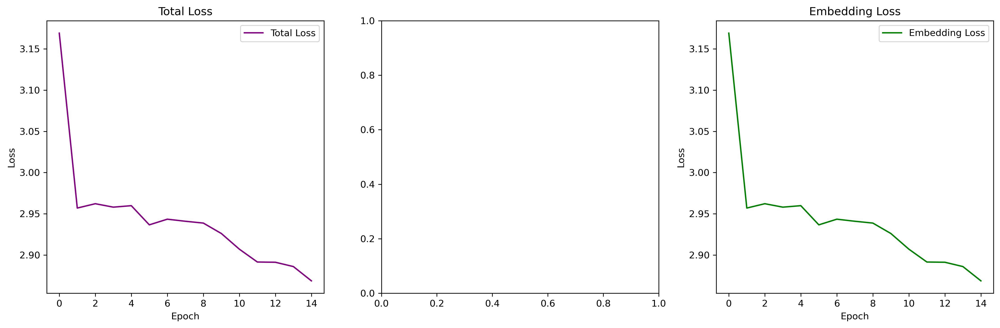

In [ ]:
total_losses, interaction_losses, embedding_losses = train_and_plot_simple(epochs=epochs,
                                                                           train_loader=train_loader,
                                                                           node_model=node_model_tuning.to(device),
                                                                           edge_model=edge_model_tuning.to(device),
                                                                           temperature=temperature,
                                                                           alpha=1,
                                                                           save_model=False)

# Model Testing

In [350]:
def generate_hic_matrix(data, edge_values):
    """
    Reassembles a Hi-C contact matrix from a Data object and corresponding edge values.
    
    For every edge (i, j) in the data, the value from edge_values is placed in both matrix[i, j]
    and matrix[j, i] (ensuring symmetry).
    """
    num_nodes = data.num_nodes
    hic_matrix = torch.zeros((num_nodes, num_nodes))
    if edge_values.ndim > 1:
        edge_values = edge_values[:, 0]  # Use the first dimension if multi-dimensional.
    for idx in range(data.edge_index.shape[1]):
        i = data.edge_index[0, idx].item()
        j = data.edge_index[1, idx].item()
        val = edge_values[idx].item()/2
        hic_matrix[i, j] = val
        hic_matrix[j, i] = val
    return hic_matrix

## Loading Saved Weights

In [355]:
# Load weights
node_model.load_state_dict(torch.load("/Users/ali/Desktop/NYU/4th Semester/Deep Learning/HiC/node_model_epoch30.pt"))

<All keys matched successfully>

In [356]:
test_ss = link_prediction_test_step(data_test=test_graph_data,
                                    node_model=node_model,
                                    edge_model=edge_model)

## Predicted Hi-C Matrix Visualization

We just need to scale up the predictions of the Edge MLP by 100 times and they can reconstruct a Hi-C matrix. 

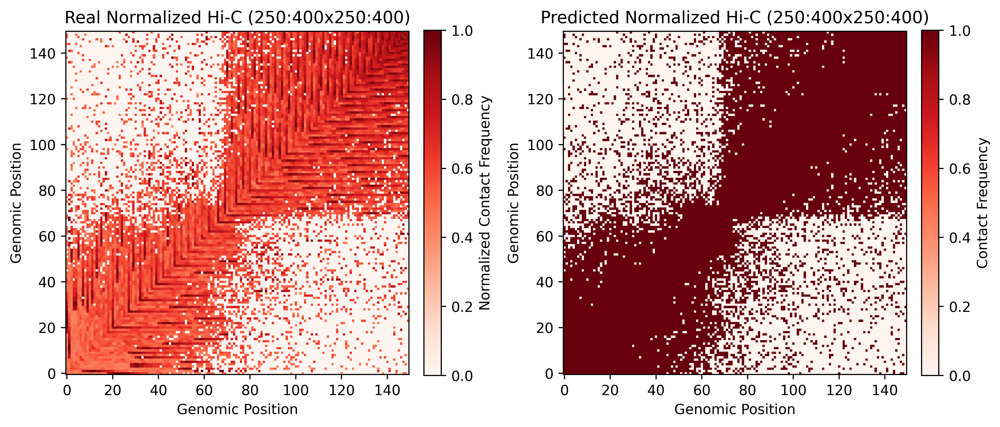

In [ ]:
hic_actual = normalize_matrix(np.matrix(generate_hic_matrix(test_graph_data, test_graph_data.edge_attr.squeeze())))
hic_predicted = normalize_matrix(np.matrix(generate_hic_matrix(test_graph_data, test_ss.squeeze()+1))) #+1 to avoid division by zero in normalization

fig, axes = plt.subplots(1, 2, figsize=(10, 5), dpi=500)

# -------------------------------------------------------------------------
# First subplot: Original Hi-C map (a large region, e.g. 5000x5000)
# -------------------------------------------------------------------------
# Here we display a large area from the original Hi-C map.
im0 = axes[0].imshow(hic_actual,
                     cmap='Reds',
                     interpolation='nearest', origin='lower')
axes[0].set_title(f"Real Normalized Hi-C ({start_position}:{start_position+mask_size}x{start_position}:{start_position+mask_size})")
axes[0].set_xlabel("Genomic Position")
axes[0].set_ylabel("Genomic Position")
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# -------------------------------------------------------------------------
# Second subplot: Predicted Hi-C map (a zoomed-in region, e.g. 50x50)
# -------------------------------------------------------------------------
# Here we display a smaller zoomed region from the predicted Hi-C matrix.
im1 = axes[1].imshow(hic_predicted,
                     cmap='Reds',
                     interpolation='nearest', origin='lower')
axes[1].set_title(f"Predicted Normalized Hi-C ({start_position}:{start_position+mask_size}x{start_position}:{start_position+mask_size})")
axes[1].set_xlabel("Genomic Position")
axes[1].set_ylabel("Genomic Position")
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label="Contact Frequency")

plt.tight_layout()
plt.show()

# Dimensionality Reduction on Feature Embeddings

In [358]:
#full_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:5000, :5000], chromosome=3)
full_graph_data = hic_matrix_to_graph(chr3_hic_matrix[:5000, :5000])

print("Graph summary:\n",
      f"- Nodes: {full_graph_data.num_nodes}\n",
      f"- Edges: {full_graph_data.num_edges}\n",
      f"- Node features: {full_graph_data.x.shape}\n",
      f"- Edge features: {full_graph_data.edge_attr.shape}")

print("\n Masked Graph summary:\n",
      f"- Nodes: {len(train_graph_data.x)}\n",
      f"- Node features: {train_graph_data.x.shape}")

print("\n Test Graph summary:\n",
      f"- Nodes: {len(test_graph_data.x)}\n",
      f"- Node features: {test_graph_data.x.shape}")

Graph summary:
 - Nodes: 5000
 - Edges: 764750
 - Node features: torch.Size([5000, 2])
 - Edge features: torch.Size([764750, 1])

 Masked Graph summary:
 - Nodes: 90
 - Node features: torch.Size([90, 2])

 Test Graph summary:
 - Nodes: 150
 - Node features: torch.Size([150, 2])


## Chromsome 2 Graph

In [13]:
chr_2_path = './imr90/hic_matrix/chr2.npz'  # Load the Hi-C matrix for chr2.
chr2_hic_matrix = load_hic_data(chr_2_path)  # Load and normalize the Hi-C matrix for chr2.
#chr2_graph_data = hic_matrix_to_graph(chr2_hic_matrix[:5000, :5000], chromosome=2)
chr2_graph_data = hic_matrix_to_graph(chr2_hic_matrix[:5000, :5000])

print("Graph summary:\n",
      f"- Nodes: {chr2_graph_data.num_nodes}\n",
      f"- Edges: {chr2_graph_data.num_edges}\n",
      f"- Node features: {chr2_graph_data.x.shape}\n",
      f"- Edge features: {chr2_graph_data.edge_attr.shape}")

Graph summary:
 - Nodes: 5000
 - Edges: 607472
 - Node features: torch.Size([5000, 2])
 - Edge features: torch.Size([607472, 1])


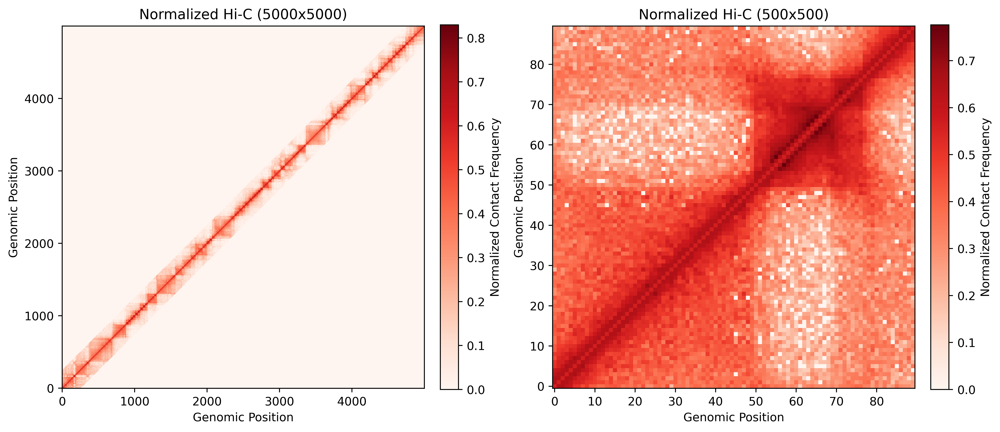

In [365]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=500)

# Left: Full 5000x5000 normalized matrix
im1 = axes[0].imshow(chr2_hic_matrix[:5000, :5000], cmap='Reds', interpolation='nearest', origin='lower')
axes[0].set_title("Normalized Hi-C (5000x5000)")
axes[0].set_xlabel("Genomic Position")
axes[0].set_ylabel("Genomic Position")
fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

# Right: Zoom-in on 500x500 region
im2 = axes[1].imshow(chr2_hic_matrix[105:195, 105:195], cmap='Reds', interpolation='nearest', origin='lower')
axes[1].set_title("Normalized Hi-C (500x500)")
axes[1].set_xlabel("Genomic Position")
axes[1].set_ylabel("Genomic Position")
fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04, label="Normalized Contact Frequency")

plt.tight_layout()
plt.show()

In [361]:
node_model.eval()
node_embeddings_tensor = node_model(full_graph_data)
node_embeddings_tensor_chr2 = node_model(chr2_graph_data)

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clust

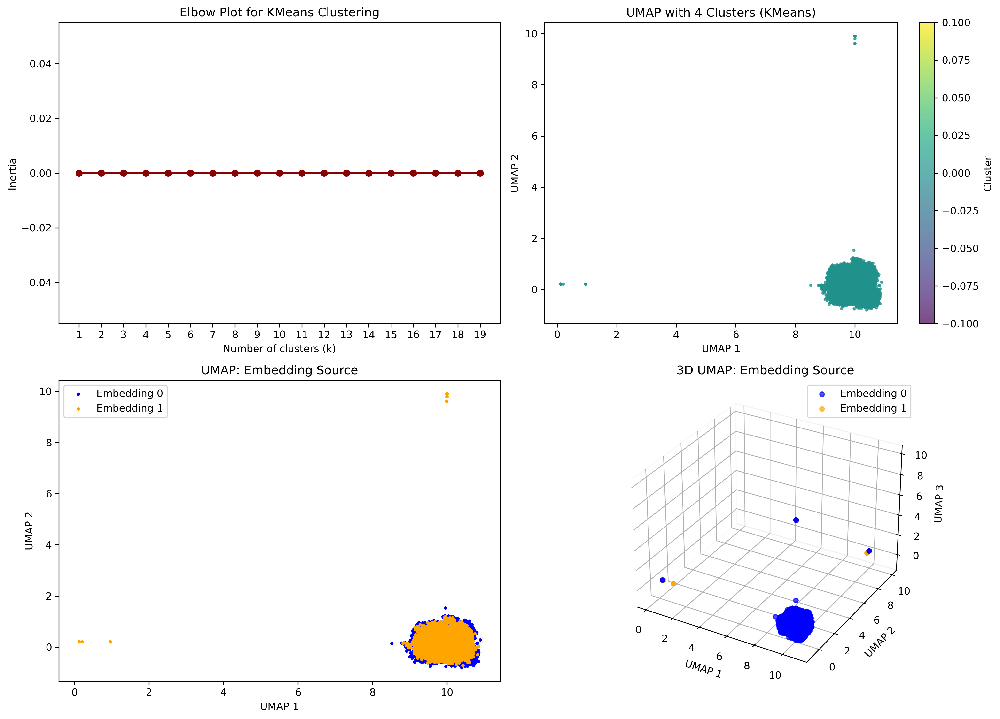

In [362]:
# Prepare embeddings
node_embeddings = node_embeddings_tensor.detach().cpu().numpy()
node_embeddings_chr2 = node_embeddings_tensor_chr2.detach().cpu().numpy()

# Combine embeddings
combined_embeddings = np.vstack([node_embeddings, node_embeddings_chr2])

# Create labels: 0 for node_embeddings, 1 for node_embeddings_chr2
embedding_labels = np.array([0]*len(node_embeddings) + [1]*len(node_embeddings_chr2))

# UMAP dimensionality reduction to 3 components
reducer = umap.UMAP(
    n_neighbors=7,
    learning_rate=0.001,
    metric='manhattan',
    min_dist=0.01,
    n_epochs=epochs,
    random_state=42,
    repulsion_strength=1.5,
    n_components=3
)
umap_emb = reducer.fit_transform(combined_embeddings)

# Elbow plot for KMeans (only on combined_embeddings)
inertias = []
K = range(1, 20)
for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(combined_embeddings)
    inertias.append(km.inertia_)

# Apply KMeans with the chosen best k
best_k = 4
kmeans = KMeans(n_clusters=best_k, random_state=42)
clusters = kmeans.fit_predict(combined_embeddings)

# Create a single figure and manually add subplots
fig = plt.figure(figsize=(14, 10), dpi=300)

# Plot 1: Elbow Plot
ax1 = fig.add_subplot(2, 2, 1)
ax1.plot(K, inertias, marker='o', color='darkred')
ax1.set_title("Elbow Plot for KMeans Clustering")
ax1.set_xlabel("Number of clusters (k)")
ax1.set_ylabel("Inertia")
ax1.set_xticks(list(K))
ax1.grid(False)

# Plot 2: 2D UMAP colored by KMeans clusters
ax2 = fig.add_subplot(2, 2, 2)
sc2 = ax2.scatter(umap_emb[:, 0], umap_emb[:, 1], c=clusters, cmap='viridis', s=5, alpha=0.7)
ax2.set_title(f"UMAP with {best_k} Clusters (KMeans)")
ax2.set_xlabel("UMAP 1")
ax2.set_ylabel("UMAP 2")
fig.colorbar(sc2, ax=ax2, label="Cluster")

# Plot 3: Plain 2D UMAP colored by embedding source
ax3 = fig.add_subplot(2, 2, 3)
colors = ['blue', 'orange']
for label_value in np.unique(embedding_labels):
    ax3.scatter(
        umap_emb[embedding_labels == label_value, 0],
        umap_emb[embedding_labels == label_value, 1],
        s=5,
        color=colors[label_value],
        label=f"Embedding {label_value}"
    )
ax3.set_title("UMAP: Embedding Source")
ax3.set_xlabel("UMAP 1")
ax3.set_ylabel("UMAP 2")
ax3.legend()

# Plot 4: 3D UMAP colored by embedding source
ax4 = fig.add_subplot(2, 2, 4, projection='3d')
for label_value in np.unique(embedding_labels):
    ax4.scatter(
        umap_emb[embedding_labels == label_value, 0],
        umap_emb[embedding_labels == label_value, 1],
        umap_emb[embedding_labels == label_value, 2],
        s=20,
        color=colors[label_value],
        label=f"Embedding {label_value}",
        alpha=0.7
    )
ax4.set_title("3D UMAP: Embedding Source")
ax4.set_xlabel('UMAP 1')
ax4.set_ylabel('UMAP 2')
ax4.set_zlabel('UMAP 3')
ax4.grid(True)
ax4.legend()

# white background for 3D walls
for axis in (ax4.xaxis, ax4.yaxis, ax4.zaxis):
    axis.pane.set_facecolor((1, 1, 1, 1))

plt.tight_layout()
plt.show()

# Training on Chromosome 2

In [375]:
learning_rate = 0.001
weight_decay = 0.05
hidden_dims = 32
dropout = 0.5
epochs = 30
temperature = 0.1
out_features = 8

node_model = Nodes_GraphAttentionNetwork(in_features=2, 
                                  out_features=out_features, 
                                  hidden_dims=hidden_dims, 
                                  num_heads=1, 
                                  dropout=dropout,
                                  self_loops=True).to(device)

# Load weights
node_model.load_state_dict(torch.load("/Users/ali/Desktop/NYU/4th Semester/Deep Learning/HiC/node_model_epoch30.pt"))

edge_model = Edge_MLP(input_dim=out_features,
                      output_dim=1,
                      dropout=dropout).to(device)

optimizer_node = torch.optim.Adam(node_model.parameters(), lr=learning_rate, weight_decay=weight_decay)
optimizer_edge = torch.optim.Adam(edge_model.parameters(), lr=learning_rate, weight_decay=weight_decay)

In [376]:
chr2_graph_data = hic_matrix_to_graph(chr2_hic_matrix[105:195, 105:195])
train_data = SubgraphDataset(graph_data=chr2_graph_data, num_hops=2, verbose=False)
train_loader = DataLoader(train_data, batch_size=8, shuffle=True)  # Use torch_geometric.loader.DataLoader

# 4. Test one batch
for batch in train_loader:
    print("✅ Batch loaded!")
    print("Batch is of type:", type(batch))
    print("Edge index shape:", batch.edge_index.shape)
    print("Node features shape:", batch.x.shape)
    print("Edge attributes shape:", batch.edge_attr.shape)
    print("Original node indices:", batch.original_nodes[:5])
    print("Original u:", batch.real_interaction)
    break

✅ Batch loaded!
Batch is of type: <class 'abc.DataBatch'>
Edge index shape: torch.Size([2, 45008])
Node features shape: torch.Size([720, 2])
Edge attributes shape: torch.Size([45008, 1])
Original node indices: tensor([0, 1, 2, 3, 4])
Original u: tensor([0.5539, 0.6468, 0.5393, 0.6470, 0.4700, 0.3566, 0.5623, 0.3784])


Epoch 1/30 | Combined Loss: 0.7903 | Embedding Loss: 0.7903
Epoch 2/30 | Combined Loss: 0.7747 | Embedding Loss: 0.7747
Epoch 3/30 | Combined Loss: 0.7765 | Embedding Loss: 0.7765
Epoch 4/30 | Combined Loss: 0.7678 | Embedding Loss: 0.7678
Epoch 5/30 | Combined Loss: 0.7713 | Embedding Loss: 0.7713
Epoch 6/30 | Combined Loss: 0.7453 | Embedding Loss: 0.7453
Epoch 7/30 | Combined Loss: 0.7677 | Embedding Loss: 0.7677
Epoch 8/30 | Combined Loss: 0.7973 | Embedding Loss: 0.7973
Epoch 9/30 | Combined Loss: 0.7752 | Embedding Loss: 0.7752
Epoch 10/30 | Combined Loss: 0.7544 | Embedding Loss: 0.7544
Epoch 11/30 | Combined Loss: 0.7391 | Embedding Loss: 0.7391
Epoch 12/30 | Combined Loss: 0.7547 | Embedding Loss: 0.7547
Epoch 13/30 | Combined Loss: 0.7654 | Embedding Loss: 0.7654
Epoch 14/30 | Combined Loss: 0.7524 | Embedding Loss: 0.7524
Epoch 15/30 | Combined Loss: 0.8023 | Embedding Loss: 0.8023
Epoch 16/30 | Combined Loss: 0.7616 | Embedding Loss: 0.7616
Epoch 17/30 | Combined Loss: 0.74

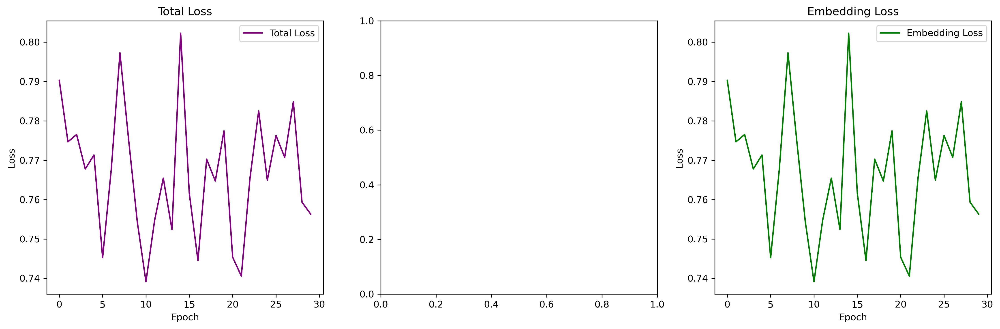

In [377]:
total_losses, interaction_losses, embedding_losses = train_and_plot_simple(epochs=epochs,
                                                                           train_loader=train_loader,
                                                                           node_model=node_model.to(device),
                                                                           edge_model=edge_model.to(device),
                                                                           temperature=temperature,
                                                                           alpha=1,
                                                                           save_model=False)

In [379]:
chr2_graph_data = hic_matrix_to_graph(chr2_hic_matrix[:5000, :5000])

node_model.eval()
node_embeddings_tensor = node_model(full_graph_data)
node_embeddings_tensor_chr2 = node_model(chr2_graph_data)

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clust

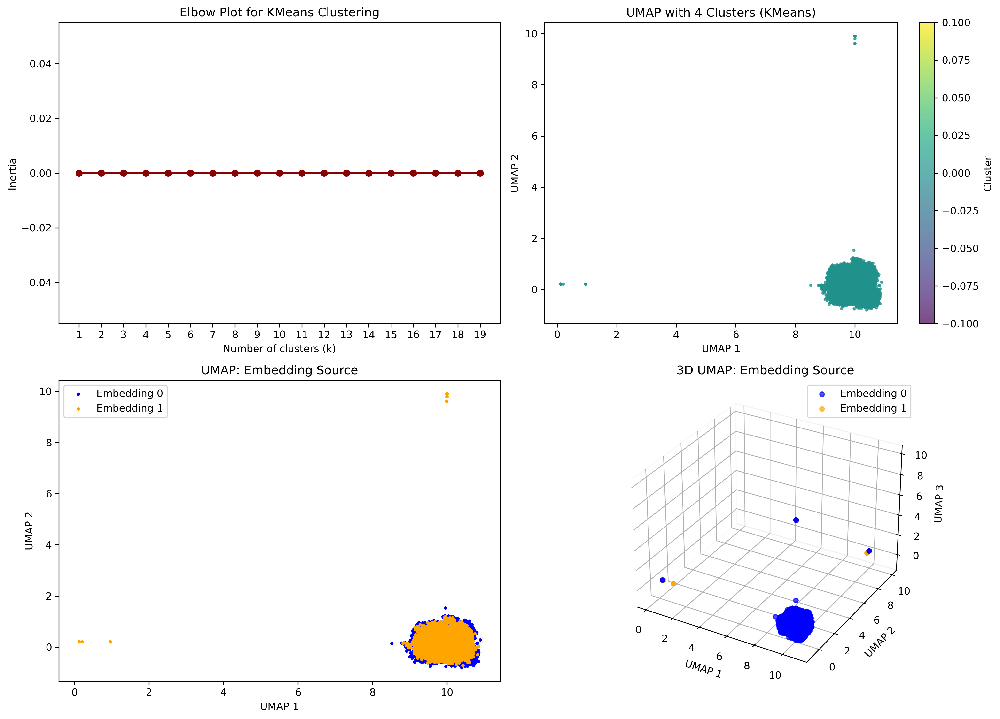

In [380]:
# Prepare embeddings
node_embeddings = node_embeddings_tensor.detach().cpu().numpy()
node_embeddings_chr2 = node_embeddings_tensor_chr2.detach().cpu().numpy()

# Combine embeddings
combined_embeddings = np.vstack([node_embeddings, node_embeddings_chr2])

# Create labels: 0 for node_embeddings, 1 for node_embeddings_chr2
embedding_labels = np.array([0]*len(node_embeddings) + [1]*len(node_embeddings_chr2))

# UMAP dimensionality reduction to 3 components
reducer = umap.UMAP(
    n_neighbors=7,
    learning_rate=0.001,
    metric='manhattan',
    min_dist=0.01,
    n_epochs=epochs,
    random_state=42,
    repulsion_strength=1.5,
    n_components=3
)
umap_emb = reducer.fit_transform(combined_embeddings)

# Elbow plot for KMeans (only on combined_embeddings)
inertias = []
K = range(1, 20)
for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(combined_embeddings)
    inertias.append(km.inertia_)

# Apply KMeans with the chosen best k
best_k = 4
kmeans = KMeans(n_clusters=best_k, random_state=42)
clusters = kmeans.fit_predict(combined_embeddings)

# Create a single figure and manually add subplots
fig = plt.figure(figsize=(14, 10), dpi=300)

# Plot 1: Elbow Plot
ax1 = fig.add_subplot(2, 2, 1)
ax1.plot(K, inertias, marker='o', color='darkred')
ax1.set_title("Elbow Plot for KMeans Clustering")
ax1.set_xlabel("Number of clusters (k)")
ax1.set_ylabel("Inertia")
ax1.set_xticks(list(K))
ax1.grid(False)

# Plot 2: 2D UMAP colored by KMeans clusters
ax2 = fig.add_subplot(2, 2, 2)
sc2 = ax2.scatter(umap_emb[:, 0], umap_emb[:, 1], c=clusters, cmap='viridis', s=5, alpha=0.7)
ax2.set_title(f"UMAP with {best_k} Clusters (KMeans)")
ax2.set_xlabel("UMAP 1")
ax2.set_ylabel("UMAP 2")
fig.colorbar(sc2, ax=ax2, label="Cluster")

# Plot 3: Plain 2D UMAP colored by embedding source
ax3 = fig.add_subplot(2, 2, 3)
colors = ['blue', 'orange']
for label_value in np.unique(embedding_labels):
    ax3.scatter(
        umap_emb[embedding_labels == label_value, 0],
        umap_emb[embedding_labels == label_value, 1],
        s=5,
        color=colors[label_value],
        label=f"Embedding {label_value}"
    )
ax3.set_title("UMAP: Embedding Source")
ax3.set_xlabel("UMAP 1")
ax3.set_ylabel("UMAP 2")
ax3.legend()

# Plot 4: 3D UMAP colored by embedding source
ax4 = fig.add_subplot(2, 2, 4, projection='3d')
for label_value in np.unique(embedding_labels):
    ax4.scatter(
        umap_emb[embedding_labels == label_value, 0],
        umap_emb[embedding_labels == label_value, 1],
        umap_emb[embedding_labels == label_value, 2],
        s=20,
        color=colors[label_value],
        label=f"Embedding {label_value}",
        alpha=0.7
    )
ax4.set_title("3D UMAP: Embedding Source")
ax4.set_xlabel('UMAP 1')
ax4.set_ylabel('UMAP 2')
ax4.set_zlabel('UMAP 3')
ax4.grid(True)
ax4.legend()

# white background for 3D walls
for axis in (ax4.xaxis, ax4.yaxis, ax4.zaxis):
    axis.pane.set_facecolor((1, 1, 1, 1))

plt.tight_layout()
plt.show()

# Model Visualization

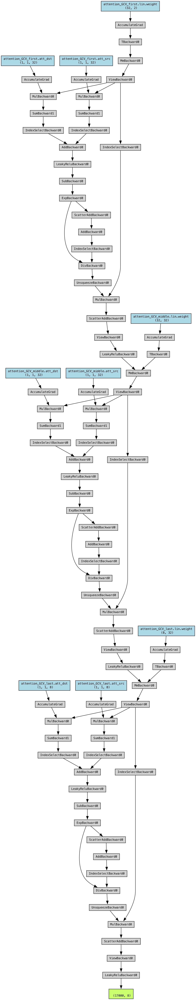

In [ ]:
out = node_model(full_graph_data)

# 4. Generate and render the graph
dot = make_dot(out, params=dict(node_model.named_parameters()))

dot.graph_attr.update(dpi='300')   

dot.render("node_model_graph", format="png")

from IPython.display import Image, display

# Render to PNG bytes at the graph’s dpi setting, then display
png_bytes = dot.pipe(format='png')
display(Image(png_bytes))